In [1]:
pip install plotly

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install contextily

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install numpy

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install pandas

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install matplotlib

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install geopandas

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install sklearn

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install osmnx

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [9]:
pip install scipy

You should consider upgrading via the '/Users/anna/PycharmProjects/dtp-stat/venv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [10]:
from plotly.graph_objs import Scatter, Figure, Layout
import plotly
import plotly.graph_objs as go

In [11]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('ggplot')
%matplotlib inline
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import KMeans
import geopandas as gpd
import contextily as ctx

In [12]:
import osmnx as ox
import networkx as nx

In [13]:
import gmaps

In [14]:
from pandas.io.json import json_normalize
import requests
import json
from datetime import datetime
import re

In [15]:
response = requests.get('https://dtp-stat.ru/media/opendata/sankt-peterburg.geojson')
response
df = response.json()
df
df = pd.json_normalize(df['features'])

In [88]:
df.head()

,type,geometry.type,geometry.coordinates,properties.id,properties.tags,properties.light,properties.point.lat,properties.point.long,properties.nearby,properties.region,...,properties.datetime,properties.severity,properties.vehicles,properties.dead_count,properties.participants,properties.injured_count,properties.parent_region,properties.road_conditions,properties.participants_count,properties.participant_categories
0,Feature,Point,"[30.325999, 59.935322]",2647681,[Дорожно-транспортные происшествия],Светлое время суток,59.935322,30.325999,"[Многоквартирные жилые дома, Мост, Регулируемы...",Центральный район,...,2021-11-05 11:45:00,Легкий,"[{'year': 2019, 'brand': 'VOLKSWAGEN', 'color'...",0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,Санкт-Петербург,"[Мокрое, Отсутствие дорожных знаков в необходи...",2,"[Пешеходы, Все участники]"
1,Feature,Point,"[30.368561, 59.950149]",2647690,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.950149,30.368561,"[Многоквартирные жилые дома, Административные ...",Центральный район,...,2021-11-05 00:11:00,Легкий,"[{'year': 2019, 'brand': 'SKODA', 'color': 'Бе...",0,[],1,Санкт-Петербург,[Мокрое],2,[Все участники]
2,Feature,Point,"[30.362424, 59.94506]",2647701,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.945060,30.362424,[Многоквартирные жилые дома],Центральный район,...,2021-11-04 17:05:00,Легкий,"[{'year': 2021, 'brand': 'Прочие марки легковы...",0,"[{'role': 'Пешеход, перед ДТП находившийся в (...",1,Санкт-Петербург,[Мокрое],2,"[Пешеходы, Все участники]"
3,Feature,Point,"[30.364065, 59.933108]",2647711,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.933108,30.364065,"[Многоквартирные жилые дома, Регулируемый пере...",Центральный район,...,2021-11-04 22:00:00,Легкий,"[{'year': 2011, 'brand': 'VOLKSWAGEN', 'color'...",0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,Санкт-Петербург,"[Иные недостатки, Мокрое, Неправильное примене...",2,"[Пешеходы, Все участники]"
4,Feature,Point,"[30.352961, 59.938816]",1919462,[Дорожно-транспортные происшествия],Светлое время суток,59.938816,30.352961,"[Многоквартирные жилые дома, Нерегулируемый пе...",Центральный район,...,2019-06-10 15:49:00,Легкий,"[{'year': 2010, 'brand': 'НефАЗ', 'color': 'Мн...",0,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",1,Санкт-Петербург,[Сухое],2,"[Пешеходы, Все участники]"


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42672 entries, 0 to 42671
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   type                               42672 non-null  object 
 1   geometry.type                      42672 non-null  object 
 2   geometry.coordinates               42672 non-null  object 
 3   properties.id                      42672 non-null  int64  
 4   properties.tags                    42672 non-null  object 
 5   properties.light                   42672 non-null  object 
 6   properties.point.lat               41480 non-null  float64
 7   properties.point.long              41480 non-null  float64
 8   properties.nearby                  42672 non-null  object 
 9   properties.region                  42672 non-null  object 
 10  properties.scheme                  38706 non-null  object 
 11  properties.address                 40947 non-null  obj

In [18]:
df.pop('properties.scheme')
df.pop('properties.vehicles')
df.pop('type')
df.pop('properties.parent_region')
df.pop('geometry.coordinates')
df.pop('properties.address')

0                   г Санкт-Петербург, пр-кт Невский, 28
1              г Санкт-Петербург, наб Воскресенская, 6-8
2                  г Санкт-Петербург, ул Фурштатская, 33
3                    г Санкт-Петербург, пер Орловский, 7
4                       г Санкт-Петербург, ул Чехова, 17
                              ...                       
42667         г Санкт-Петербург, пр-кт Измайловский, 23А
42668                г Санкт-Петербург, ул Витебская, 20
42669            г Санкт-Петербург, пр-кт Московский, 73
42670          г Санкт-Петербург, ул Введенский канал, 2
42671    г Санкт-Петербург, пр-кт Старо-Петергофский, 14
Name: properties.address, Length: 42672, dtype: object

In [19]:
df.pop('geometry.type')

0        Point
1        Point
2        Point
3        Point
4        Point
         ...  
42667    Point
42668    Point
42669    Point
42670    Point
42671    Point
Name: geometry.type, Length: 42672, dtype: object

In [20]:
df.shape

(42672, 18)

In [22]:
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE))
gdf.crs = "EPSG:4326"
gdf

,properties.id,properties.tags,properties.light,LATITUDE,LONGITUDE,properties.nearby,properties.region,properties.weather,properties.category,properties.datetime,properties.severity,properties.dead_count,properties.participants,properties.injured_count,properties.road_conditions,properties.participants_count,properties.participant_categories,geometry
0,2647681,[Дорожно-транспортные происшествия],Светлое время суток,59.935322,30.325999,"[Многоквартирные жилые дома, Мост, Регулируемы...",Центральный район,[Пасмурно],Наезд на пешехода,2021-11-05 11:45:00,Легкий,0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,"[Мокрое, Отсутствие дорожных знаков в необходи...",2,"[Пешеходы, Все участники]",POINT (30.32600 59.93532)
1,2647690,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.950149,30.368561,"[Многоквартирные жилые дома, Административные ...",Центральный район,[Дождь],Столкновение,2021-11-05 00:11:00,Легкий,0,[],1,[Мокрое],2,[Все участники],POINT (30.36856 59.95015)
2,2647701,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.945060,30.362424,[Многоквартирные жилые дома],Центральный район,[Пасмурно],Наезд на стоящее ТС,2021-11-04 17:05:00,Легкий,0,"[{'role': 'Пешеход, перед ДТП находившийся в (...",1,[Мокрое],2,"[Пешеходы, Все участники]",POINT (30.36242 59.94506)
3,2647711,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.933108,30.364065,"[Многоквартирные жилые дома, Регулируемый пере...",Центральный район,[Пасмурно],Съезд с дороги,2021-11-04 22:00:00,Легкий,0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,"[Иные недостатки, Мокрое, Неправильное примене...",2,"[Пешеходы, Все участники]",POINT (30.36407 59.93311)
4,1919462,[Дорожно-транспортные происшествия],Светлое время суток,59.938816,30.352961,"[Многоквартирные жилые дома, Нерегулируемый пе...",Центральный район,[Ясно],Наезд на пешехода,2019-06-10 15:49:00,Легкий,0,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",1,[Сухое],2,"[Пешеходы, Все участники]",POINT (30.35296 59.93882)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42667,1931064,[Дорожно-транспортные происшествия],Светлое время суток,59.910556,30.306667,[Регулируемый перекресток],Адмиралтейский район,[Пасмурно],Столкновение,2015-10-27 09:44:00,С погибшими,1,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",2,"[Мокрое, Отсутствие пешеходных ограждений в не...",7,"[Пешеходы, Все участники]",POINT (30.30667 59.91056)
42668,1931188,[Дорожно-транспортные происшествия],Светлое время суток,59.919167,30.277778,"[Многоквартирные жилые дома, Внутридворовая те...",Адмиралтейский район,[Ясно],Наезд на пешехода,2015-10-11 16:00:00,Тяжёлый,0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,[Сухое],2,"[Пешеходы, Все участники]",POINT (30.27778 59.91917)
42669,1931242,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.903889,30.318056,[],Адмиралтейский район,[Пасмурно],Наезд на препятствие,2015-10-04 18:30:00,Тяжёлый,0,[],1,[Сухое],2,[Все участники],POINT (30.31806 59.90389)
42670,1901456,[Дорожно-транспортные происшествия],Светлое время суток,59.922923,30.322398,"[Нерегулируемый пешеходный переход, Нерегулиру...",Адмиралтейский район,[Пасмурно],Наезд на пешехода,2018-01-09 18:00:00,Легкий,0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,[Сухое],2,"[Пешеходы, Все участники]",POINT (30.32240 59.92292)


In [21]:
gdf.shape

(42672, 25)

In [16]:
df.rename(columns = {'properties.point.lat':'LATITUDE'}, inplace = True)
df.rename(columns = {'properties.point.long':'LONGITUDE'}, inplace = True)

In [93]:
gdf.shape

(42672, 19)

In [55]:
fig = go.Figure(go.Scattermapbox(lat=gdf['LATITUDE'], lon=df['LONGITUDE']))
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [262]:
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

type - 0%
geometry.type - 0%
geometry.coordinates - 0%
properties.id - 0%
properties.tags - 0%
properties.light - 0%
LATITUDE - 3%
LONGITUDE - 3%
properties.nearby - 0%
properties.region - 0%
properties.scheme - 9%
properties.address - 4%
properties.weather - 0%
properties.category - 0%
properties.datetime - 0%
properties.severity - 0%
properties.vehicles - 0%
properties.dead_count - 0%
properties.participants - 0%
properties.injured_count - 0%
properties.parent_region - 0%
properties.road_conditions - 0%
properties.participants_count - 0%
properties.participant_categories - 0%
geometry - 0%


In [298]:
df = df.dropna()
df.isna().values.any()

False

In [299]:
gdf = gdf.dropna()

In [169]:
gdf[['LATITUDE','LONGITUDE']].describe(percentiles=[.01,.05,.1,.25,.5,.9,.95,.99])

,LATITUDE,LONGITUDE
count,29268.000000,29268.000000
mean,59.928737,30.302163
std,0.087896,0.140614
min,59.603900,29.490331
1%,59.707171,29.769180
5%,59.781264,29.995386
10%,59.830591,30.146900
25%,59.863049,30.256369
50%,59.931135,30.327916
90%,60.035846,30.444700


In [23]:
gdf = gdf[gdf['LATITUDE'].between(59.60,60.19) & gdf['LONGITUDE'].between(29.49,30.49)]
df = df[df['LATITUDE'].between(59.60,60.19) & df['LONGITUDE'].between(29.49,30.49)]

In [24]:
df.shape

(34259, 18)

In [60]:
fig = go.Figure(go.Scattermapbox(lat=gdf['LATITUDE'], lon=gdf['LONGITUDE']))
fig.update_layout(mapbox_style="open-street-map")
fig.show()

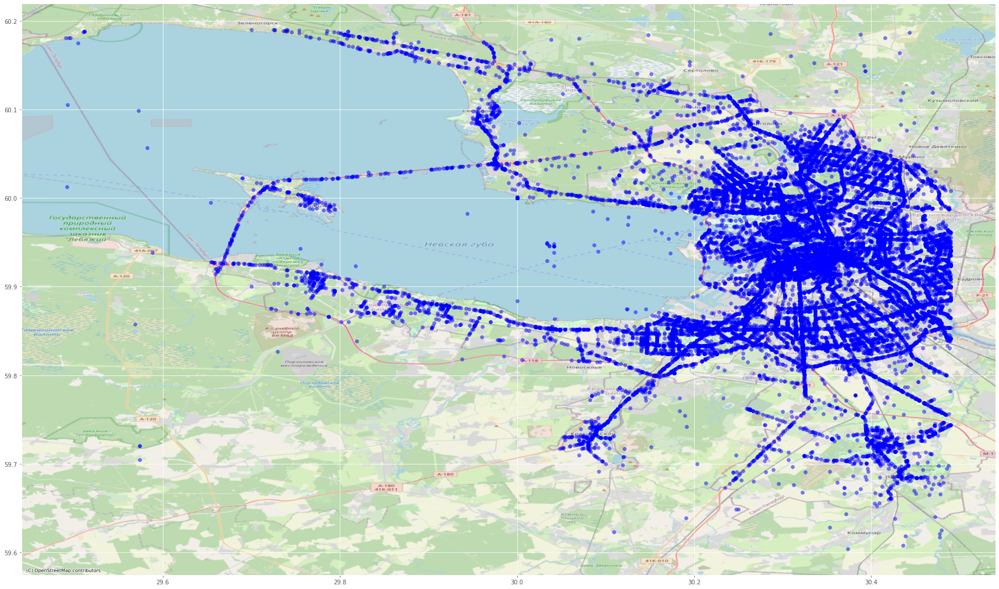

In [267]:
ax = gdf.plot(color="blue", figsize=(30, 30), alpha=0.5)
ctx.add_basemap(ax, 
                crs=gdf.crs.to_string(), 
                source=ctx.providers.OpenStreetMap.Mapnik)

In [96]:
df['properties.category'].value_counts()

Столкновение                                                                                                 13820
Наезд на пешехода                                                                                            12622
Падение пассажира                                                                                             2143
Наезд на препятствие                                                                                          1835
Наезд на велосипедиста                                                                                        1767
Наезд на стоящее ТС                                                                                           1378
Опрокидывание                                                                                                  296
Съезд с дороги                                                                                                 218
Иной вид ДТП                                                                    

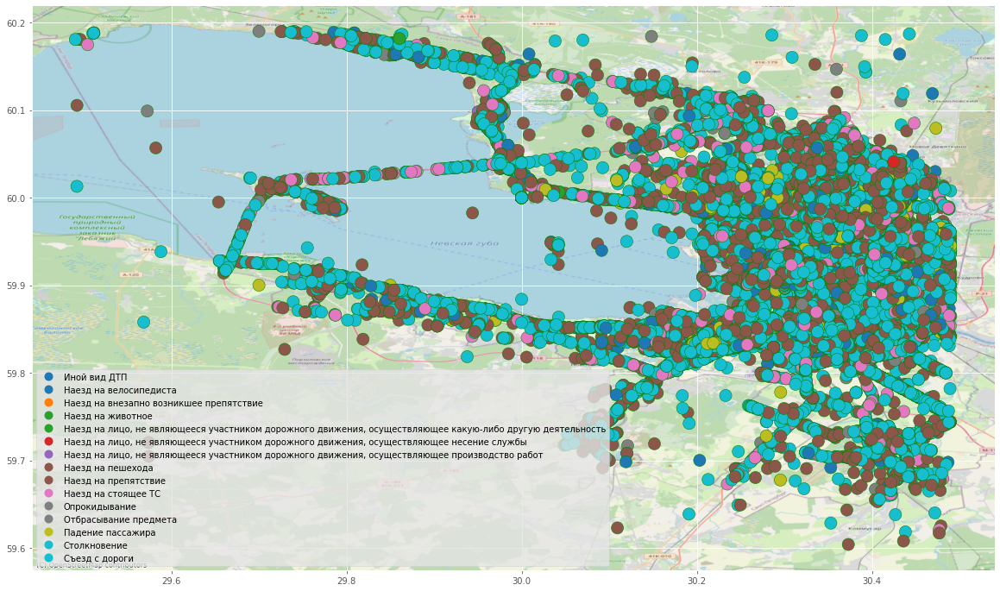

In [42]:
ax = gdf.plot(column='properties.category',
                categorical=True,
                legend=True,
               figsize=(20, 30), alpha=1, edgecolor='g', markersize= 200)
ctx.add_basemap(ax, 
                crs=gdf.crs.to_string(), 
                source=ctx.providers.OpenStreetMap.Mapnik)

<AxesSubplot:>

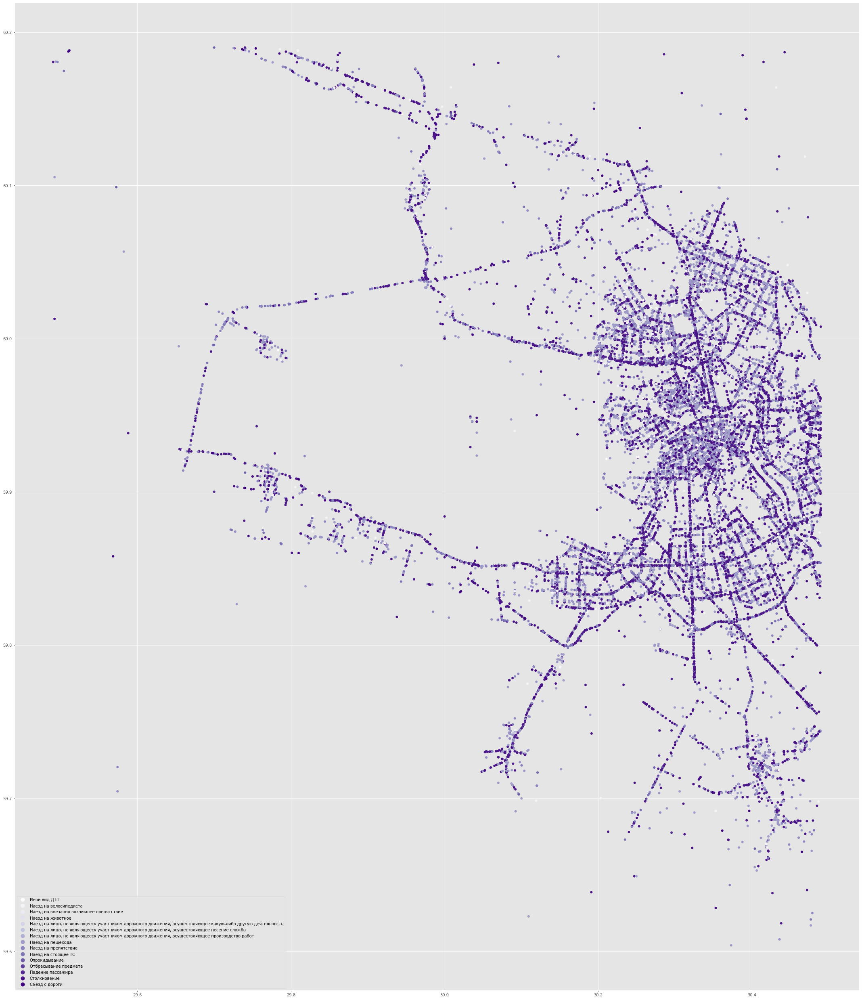

In [43]:
gdf.plot(column = 'properties.category', linewidth=0,cmap = 'Purples' , legend=True, figsize=[45,45])

In [25]:
import seaborn as sns

In [26]:
df['properties.datetime'] = pd.to_datetime(df['properties.datetime'], format='%Y-%m-%d %H:%M:%S.%f')
df['properties.datetime']

0       2021-11-05 11:45:00
1       2021-11-05 00:11:00
2       2021-11-04 17:05:00
3       2021-11-04 22:00:00
4       2019-06-10 15:49:00
                ...        
42667   2015-10-27 09:44:00
42668   2015-10-11 16:00:00
42669   2015-10-04 18:30:00
42670   2018-01-09 18:00:00
42671   2015-02-13 00:15:00
Name: properties.datetime, Length: 34259, dtype: datetime64[ns]

In [27]:
df['data'], df['Time'] = zip(*[(d.date(), d.time()) for d in df['properties.datetime']])

In [28]:
df['data'] = pd.to_datetime(df['data'], format='%Y-%m-%d')


In [29]:
df['data']

0       2021-11-05
1       2021-11-05
2       2021-11-04
3       2021-11-04
4       2019-06-10
           ...    
42667   2015-10-27
42668   2015-10-11
42669   2015-10-04
42670   2018-01-09
42671   2015-02-13
Name: data, Length: 34259, dtype: datetime64[ns]

In [30]:
df['year'] = df['data'].dt.year

In [31]:
df['year']

0        2021
1        2021
2        2021
3        2021
4        2019
         ... 
42667    2015
42668    2015
42669    2015
42670    2018
42671    2015
Name: year, Length: 34259, dtype: int64

In [240]:
dfс = df['properties.category'].value_counts().rename_axis('type').reset_index(name='counts')

In [241]:
dfс

,type,counts
0,Столкновение,13820
1,Наезд на пешехода,12622
2,Падение пассажира,2143
3,Наезд на препятствие,1835
4,Наезд на велосипедиста,1767
5,Наезд на стоящее ТС,1378
6,Отбрасывание предмета,13


In [35]:
df  = df.loc[df['properties.category'] != 'Опрокидывание']
df = df.loc[df['properties.category'] != 'Съезд с дороги']
df = df.loc[df['properties.category'] != 'Иной вид ДТП']
df = df.loc[df['properties.category'] != 'Наезд на лицо, не являющееся участником дорожного движения, осуществляющее несение службы']
df = df.loc[df['properties.category'] != 'Наезд на внезапно возникшее препятствие']
df = df.loc[df['properties.category'] != 'Наезд на животное']
df = df.loc[df['properties.category'] != 'Падение груза']
df = df.loc[df['properties.category'] != 'Наезд на лицо, не являющееся участником дорожного движения, осуществляющее производство работ']
df = df.loc[df['properties.category'] != 'Наезд на лицо, не являющееся участником дорожного движения, осуществляющее какую-либо другую деятельность']

In [36]:
df1 = df
df1.pop('data')
df1.pop('Time')
df1.pop('properties.datetime')

0       2021-11-05 11:45:00
1       2021-11-05 00:11:00
2       2021-11-04 17:05:00
4       2019-06-10 15:49:00
5       2021-04-15 08:10:00
                ...        
42667   2015-10-27 09:44:00
42668   2015-10-11 16:00:00
42669   2015-10-04 18:30:00
42670   2018-01-09 18:00:00
42671   2015-02-13 00:15:00
Name: properties.datetime, Length: 33578, dtype: datetime64[ns]

In [68]:
#df1 = df1.set_index('properties.category')
df1 = df
df1

,properties.id,properties.tags,properties.light,LATITUDE,LONGITUDE,properties.nearby,properties.region,properties.weather,properties.category,properties.severity,properties.dead_count,properties.participants,properties.injured_count,properties.road_conditions,properties.participants_count,properties.participant_categories,geometry,year
0,2647681,[Дорожно-транспортные происшествия],Светлое время суток,59.935322,30.325999,"[Многоквартирные жилые дома, Мост, Регулируемы...",Центральный район,[Пасмурно],Наезд на пешехода,Легкий,0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,"[Мокрое, Отсутствие дорожных знаков в необходи...",2,"[Пешеходы, Все участники]",POINT (30.32600 59.93532),2021
1,2647690,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.950149,30.368561,"[Многоквартирные жилые дома, Административные ...",Центральный район,[Дождь],Столкновение,Легкий,0,[],1,[Мокрое],2,[Все участники],POINT (30.36856 59.95015),2021
2,2647701,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.945060,30.362424,[Многоквартирные жилые дома],Центральный район,[Пасмурно],Наезд на стоящее ТС,Легкий,0,"[{'role': 'Пешеход, перед ДТП находившийся в (...",1,[Мокрое],2,"[Пешеходы, Все участники]",POINT (30.36242 59.94506),2021
4,1919462,[Дорожно-транспортные происшествия],Светлое время суток,59.938816,30.352961,"[Многоквартирные жилые дома, Нерегулируемый пе...",Центральный район,[Ясно],Наезд на пешехода,Легкий,0,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",1,[Сухое],2,"[Пешеходы, Все участники]",POINT (30.35296 59.93882),2019
5,2560895,"[Дорожно-транспортные происшествия, ДТП и пост...",Светлое время суток,59.933404,30.342768,"[Многоквартирные жилые дома, Мост, Администрат...",Центральный район,[Ясно],Наезд на пешехода,Легкий,0,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",1,"[Плохая видимость светофора, Сухое, Отсутствие...",2,"[Пешеходы, Все участники]",POINT (30.34277 59.93340),2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42667,1931064,[Дорожно-транспортные происшествия],Светлое время суток,59.910556,30.306667,[Регулируемый перекресток],Адмиралтейский район,[Пасмурно],Столкновение,С погибшими,1,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",2,"[Мокрое, Отсутствие пешеходных ограждений в не...",7,"[Пешеходы, Все участники]",POINT (30.30667 59.91056),2015
42668,1931188,[Дорожно-транспортные происшествия],Светлое время суток,59.919167,30.277778,"[Многоквартирные жилые дома, Внутридворовая те...",Адмиралтейский район,[Ясно],Наезд на пешехода,Тяжёлый,0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,[Сухое],2,"[Пешеходы, Все участники]",POINT (30.27778 59.91917),2015
42669,1931242,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",59.903889,30.318056,[],Адмиралтейский район,[Пасмурно],Наезд на препятствие,Тяжёлый,0,[],1,[Сухое],2,[Все участники],POINT (30.31806 59.90389),2015
42670,1901456,[Дорожно-транспортные происшествия],Светлое время суток,59.922923,30.322398,"[Нерегулируемый пешеходный переход, Нерегулиру...",Адмиралтейский район,[Пасмурно],Наезд на пешехода,Легкий,0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,[Сухое],2,"[Пешеходы, Все участники]",POINT (30.32240 59.92292),2018


In [79]:
dfy = df['year'].value_counts().rename_axis('year').reset_index(name='counts')

In [61]:
dfy

,year,counts
0,2019,6122
1,2018,5604
2,2020,4788
3,2016,4309
4,2017,4280
5,2015,4256
6,2021,4219


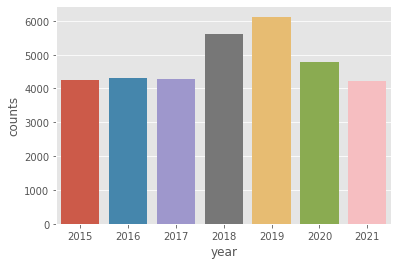

In [64]:
sns.barplot(x=dfy['year'], y=dfy['counts']);

In [246]:
sns.barplot(x=dfc['type'], y=dfc['counts']);

KeyError: 'type'

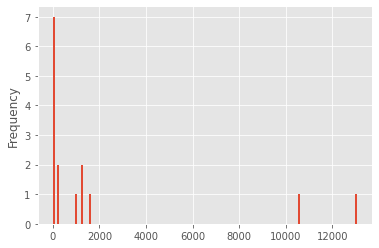

In [450]:
df1['counts'].plot.hist(bins = 150)
plt.show()

In [99]:
dff = df1[df1['properties.category'] == 'Падение пассажира']
dff = dff['year'].value_counts().rename_axis('year').reset_index(name='counts')
dff

,year,counts
0,2019,465
1,2018,447
2,2017,274
3,2020,268
4,2016,234
5,2015,231
6,2021,224


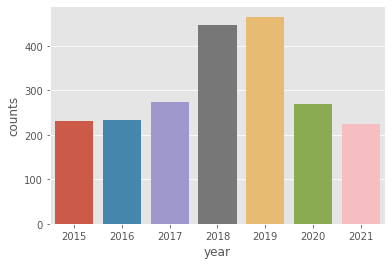

In [100]:
sns.barplot(x=dff['year'], y=dff['counts']);

In [103]:
from numpy.random import seed
from numpy.random import randn
from scipy.stats import ttest_ind

In [113]:
import scipy

In [123]:
scipy.stats.ttest_ind(dfc,)

KeyError: False

In [97]:
dfc = df1[df1['properties.category'] == 'Столкновение']
dfc = dfc['year'].value_counts().rename_axis('year').reset_index(name='counts')
dfc

,year,counts
0,2019,2548
1,2018,2246
2,2020,1987
3,2021,1789
4,2015,1771
5,2016,1752
6,2017,1727


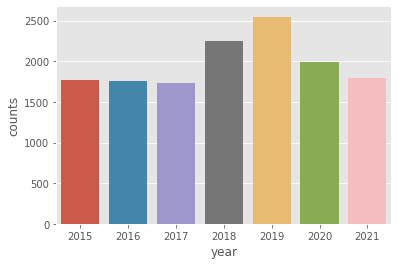

In [98]:
sns.barplot(x=dfc['year'], y=dfc['counts']);

In [95]:
dfb = df1[df1['properties.category'] == 'Наезд на велосипедиста']
dfb = dfb['year'].value_counts().rename_axis('year').reset_index(name='counts')
dfb

,year,counts
0,2020,346
1,2019,306
2,2021,304
3,2018,293
4,2015,187
5,2016,170
6,2017,161


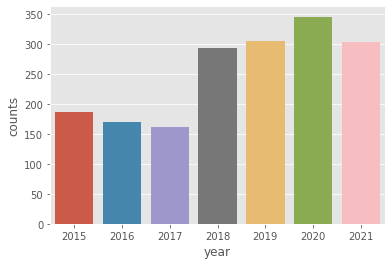

In [96]:
sns.barplot(x=dfb['year'], y=dfb['counts']);

In [89]:
dfman = df1[df1['properties.category'] == 'Наезд на пешехода']

In [90]:
dfman = dfman['year'].value_counts().rename_axis('year').reset_index(name='counts')

In [91]:
dfman

,year,counts
0,2019,2257
1,2018,2060
2,2020,1751
3,2016,1726
4,2015,1677
5,2017,1631
6,2021,1520


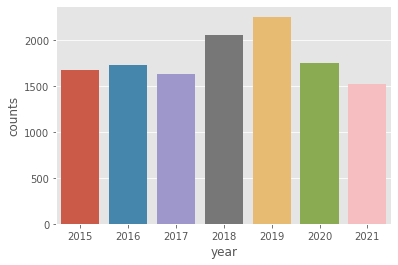

In [92]:
sns.barplot(x=dfman['year'], y=dfman['counts']);

In [117]:
dfl = df1[df1['properties.category'] == 'Наезд на препятствие']
dfl = dfl['year'].value_counts().rename_axis('year').reset_index(name='counts')
dfl

,year,counts
0,2018,330
1,2019,313
2,2017,280
3,2016,260
4,2020,233
5,2015,214
6,2021,205


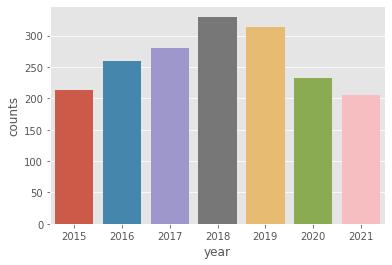

In [118]:
sns.barplot(x=dfl['year'], y=dfl['counts']);

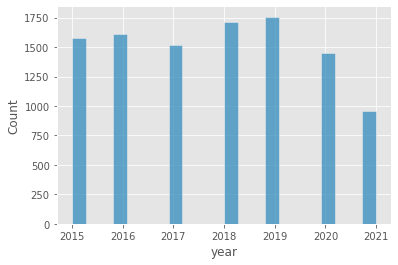

In [414]:
sns_plot = sns.histplot(dfbike['year'])


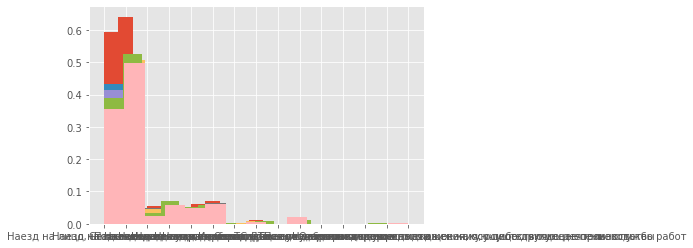

In [409]:
 ax = df.groupby('year')['properties.category'].hist(bins = 15,density = 1)

In [124]:
region = df1['properties.region'].value_counts().rename_axis('properties.region').reset_index(name='counts')

In [125]:
region

,properties.region,counts
0,Выборгский район,3818
1,Приморский район,3413
2,Невский район,2828
3,Калининский район,2768
4,Центральный район,2519
5,Московский район,2456
6,Фрунзенский район,2369
7,Красносельский район,2275
8,Красногвардейский район,1970
9,Кировский район,1762


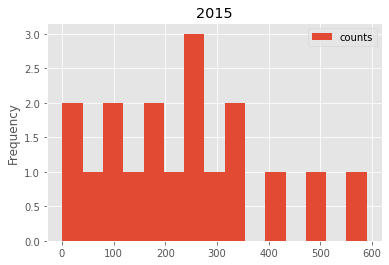

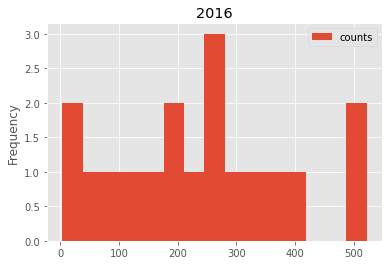

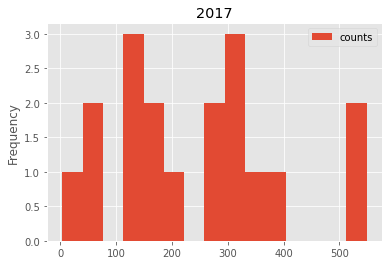

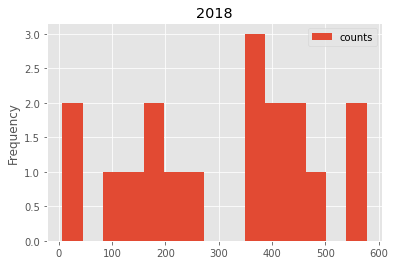

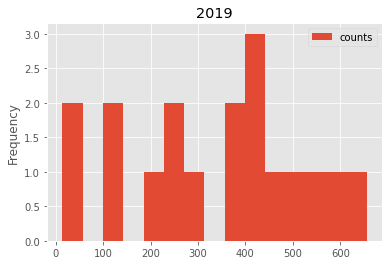

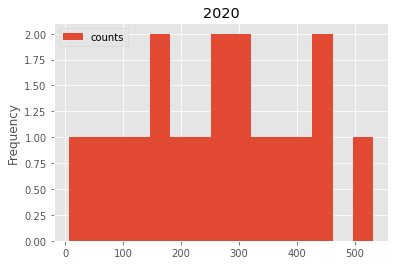

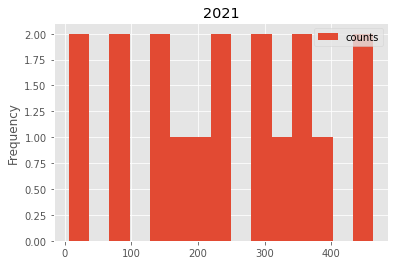

In [126]:
for i in range(2015,2022):
    df1[df1['year'] == i]['properties.region'].value_counts().rename_axis('properties.category').reset_index(name='counts').plot.hist(bins = 15, title = i)
    plt.show()

Рейтинг аварийности районов за 2015,2019,2020,2021

In [127]:
  ax2020 = df1[df1['year'] == 2020]['properties.region'].value_counts().rename_axis('properties.region').reset_index(name='counts')

In [128]:
ax2020

,properties.region,counts
0,Выборгский район,532
1,Калининский район,453
2,Московский район,443
3,Невский район,407
4,Приморский район,371
5,Центральный район,348
6,Красносельский район,317
7,Кировский район,296
8,Красногвардейский район,283
9,Фрунзенский район,279


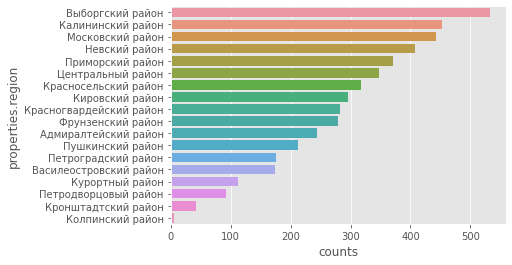

In [129]:
sns.barplot(x=ax2020['counts'], y=ax2020['properties.region']);

In [130]:
 ax2021 = df1[df1['year'] == 2021]['properties.region'].value_counts().rename_axis('properties.region').reset_index(name='counts')

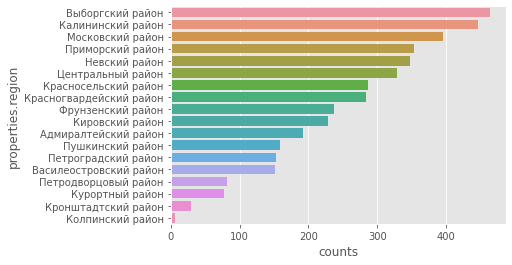

In [131]:
sns.barplot(x=ax2021['counts'], y=ax2021['properties.region']);

In [132]:
ax2015 = df1[df1['year'] == 2015]['properties.region'].value_counts().rename_axis('properties.region').reset_index(name='counts')

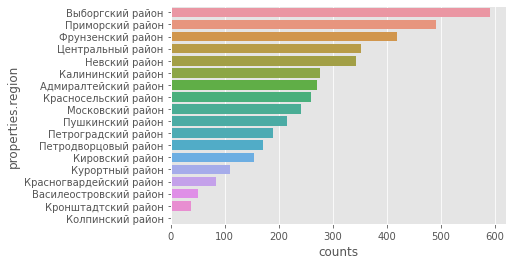

In [133]:
sns.barplot(x=ax2015['counts'], y=ax2015['properties.region']);

In [134]:
ax2019 = df1[df1['year'] == 2019]['properties.region'].value_counts().rename_axis('properties.region').reset_index(name='counts')

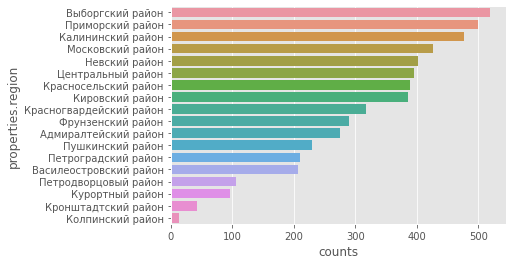

In [502]:
sns.barplot(x=ax2019['counts'], y=ax2019['properties.region']);

In [135]:
type2015 = df1[df1['year'] == 2015]['properties.category'].value_counts().rename_axis('properties.category').reset_index(name='counts')

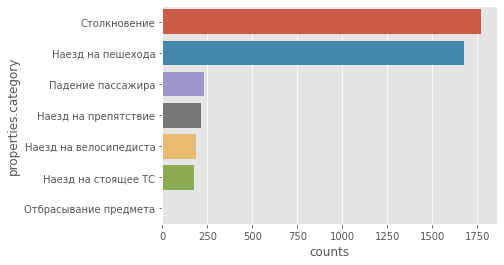

In [136]:
sns.barplot(x=type2015['counts'], y=type2015['properties.category']);

In [137]:
type2019 = df1[df1['year'] == 2019]['properties.category'].value_counts().rename_axis('properties.category').reset_index(name='counts')

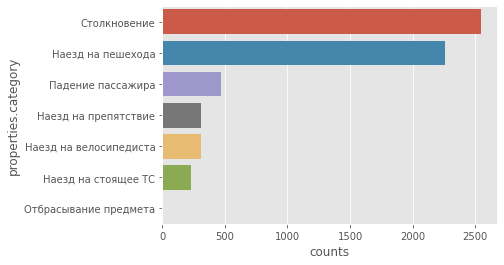

In [138]:
sns.barplot(x=type2019['counts'], y=type2019['properties.category']);

In [139]:
type2020 = df1[df1['year'] == 2020]['properties.category'].value_counts().rename_axis('properties.category').reset_index(name='counts')

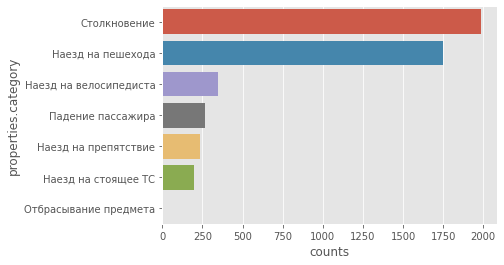

In [140]:
sns.barplot(x=type2020['counts'], y=type2020['properties.category']);

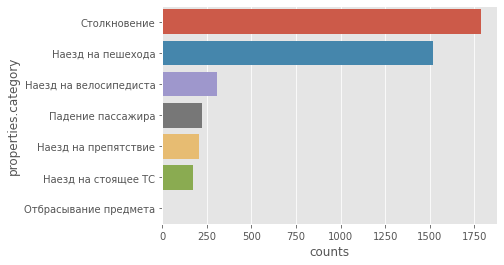

In [141]:
type2021 = df1[df1['year'] == 2021]['properties.category'].value_counts().rename_axis('properties.category').reset_index(name='counts')
sns.barplot(x=type2021['counts'], y=type2021['properties.category']);

In [142]:
type2021

,properties.category,counts
0,Столкновение,1789
1,Наезд на пешехода,1520
2,Наезд на велосипедиста,304
3,Падение пассажира,224
4,Наезд на препятствие,205
5,Наезд на стоящее ТС,174
6,Отбрасывание предмета,3


In [143]:
type2020

,properties.category,counts
0,Столкновение,1987
1,Наезд на пешехода,1751
2,Наезд на велосипедиста,346
3,Падение пассажира,268
4,Наезд на препятствие,233
5,Наезд на стоящее ТС,200
6,Отбрасывание предмета,3


In [144]:
type2019

,properties.category,counts
0,Столкновение,2548
1,Наезд на пешехода,2257
2,Падение пассажира,465
3,Наезд на препятствие,313
4,Наезд на велосипедиста,306
5,Наезд на стоящее ТС,231
6,Отбрасывание предмета,2


In [145]:
type2015

,properties.category,counts
0,Столкновение,1771
1,Наезд на пешехода,1677
2,Падение пассажира,231
3,Наезд на препятствие,214
4,Наезд на велосипедиста,187
5,Наезд на стоящее ТС,175
6,Отбрасывание предмета,1


In [151]:
from scipy.stats import shapiro, ttest_ind, levene

Изменения по количеству преступлений


In [204]:
df2020 = df1[df1['year'] == 2020]
df2015 = df1[df1['year'] == 2015]
df2019 = df1[df1['year'] == 2019]

In [216]:
norm_2015 = set()
for col in type2015:
    if shapiro(type2015[col])[1]>0.01:
        norm_2015.add(col)
norm_2020 = set()
for col in type2020:
    if shapiro(type2020[col])[1]>0.01:
        norm_2020.add(col)


ValueError: could not convert string to float: 'Наезд на велосипедиста'

In [217]:
print(norm_2015.difference(norm_2020))
print(norm_2020.difference(norm_2015))

set()
{'counts', 'properties.category'}


In [218]:
normal_columns = norm_2015.intersection(norm_2020)

In [219]:
changed_total = []
for col in normal_columns:
    if levene(df2020['properties.category'][col],df2015['properties.category'][col])[1]>0.05:
        t_val = ttest_ind(df2015['properties.category'][col],df2020['properties.category'][col], equal_var=True)[1]
        if t_val < 0.025 or t_val>1-0.025:
            changed_total.append(col)
    else:
        t_val = ttest_ind(df2020['properties.category'][col],df2015['properties.category'][col], equal_var=False)[1]
        if t_val < 0.025 or t_val>1-0.025:
            changed_total.append(col)

In [220]:
changed_total

[]

In [221]:
from scipy.stats import wilcoxon
not_normal_columns = df2020.columns.difference(normal_columns)

In [222]:
changed_total = []
for col in not_normal_columns:
    w_val = wilcoxon(type2020[col],y=type2015[col], mode='approx')[1]
    if w_val < 0.005 or w_val > 0.995:
        changed_total.append(col)

KeyError: 'properties.tags'

In [251]:
type2019.rename(columns = {'counts':'2019'}, inplace = True)
type2015.rename(columns = {'counts':'2015'}, inplace = True)

In [253]:
type2020.rename(columns = {'counts':'2020'}, inplace = True)

In [257]:
s = type2015

In [260]:
s

,2015
properties.category,
Столкновение,1771
Наезд на пешехода,1677
Падение пассажира,231
Наезд на препятствие,214
Наезд на велосипедиста,187
Наезд на стоящее ТС,175
Отбрасывание предмета,1


In [296]:
s

,2015,2019,2020,2021
properties.category,,,,
Столкновение,1771,2548,1987,1789
Наезд на пешехода,1677,2257,1751,1520
Падение пассажира,231,465,268,224
Наезд на препятствие,214,313,233,205
Наезд на велосипедиста,187,306,346,304
Наезд на стоящее ТС,175,231,200,174
Отбрасывание предмета,1,2,3,3


In [ ]:
sns.barplot(x=s['counts'], y=type2019['properties.category']);

In [293]:
norm_2015 = set()
for col in type2015:
    if shapiro(type2015[col])[2015]>0.01:
        type2015.add(col)

ValueError: could not convert string to float: 'Наезд на велосипедиста'

In [291]:
type2015

,properties.category,2015
0,Столкновение,1771
1,Наезд на пешехода,1677
2,Падение пассажира,231
3,Наезд на препятствие,214
4,Наезд на велосипедиста,187
5,Наезд на стоящее ТС,175
6,Отбрасывание предмета,1
